# Lab 8 - Segmentation

**Course**: Deep Learning for Image Analysis

**Class**: M2 IASD App  

**Professor**: Mehyar MLAWEH

**Deadline:** 🗓️ **Saturday, June 6th (23:59)**

------
**Objective:** In this lab you will go from raw images to pixel-precise segmentation masks.  
You will explore classical methods, use the Segment Anything Model (SAM ViT-B) with different prompt strategies, implement evaluation metrics from scratch, and interpret your results.

**Dataset:** Oxford-IIIT Pets (5-breed subset, 50 images)  
**Model:** SAM ViT-B (~375 MB) — the lightweight version of Meta's SAM

---
>⚠️ This notebook is **intentionally incomplete**.  
Whenever you see **`# TODO`**, you are expected to write code.


---
## Part 0 — Installation and Setup
Run the cells below once. They install all required libraries and download the SAM ViT-B checkpoint.


In [7]:
# Install required libraries
!pip install git+https://github.com/facebookresearch/segment-anything.git -q
!pip install opencv-python-headless matplotlib numpy torchvision tqdm -q
print("✅ Libraries installed")


  Preparing metadata (setup.py) ... done
✅ Libraries installed


In [8]:
import os

# Download SAM ViT-B checkpoint (~375 MB)
checkpoint_path = "sam_vit_b_01ec64.pth"
if not os.path.exists(checkpoint_path):
    print("Downloading SAM ViT-B checkpoint (~375 MB) ...")
    !wget -q --show-progress https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
    print("✅ Checkpoint downloaded")
else:
    print("✅ Checkpoint already exists")


✅ Checkpoint already exists


In [9]:
# Download Oxford-IIIT Pets dataset (images + annotations)
import os

if not os.path.exists("oxford-iiit-pet"):
    os.makedirs("oxford-iiit-pet", exist_ok=True)
    print("Downloading Oxford-IIIT Pets images ...")
    !wget -q --show-progress https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
    !wget -q --show-progress https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
    !tar -xzf images.tar.gz -C oxford-iiit-pet/
    !tar -xzf annotations.tar.gz -C oxford-iiit-pet/
    print("✅ Dataset downloaded and extracted")
else:
    print("✅ Dataset already exists")


✅ Dataset already exists


In [10]:
# Global imports — run this cell before anything else
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import torch
import os
import random
from pathlib import Path
from PIL import Image

# SAM imports
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator

# Reproducibility
random.seed(42)
np.random.seed(42)

print("✅ All imports successful")
print(f"PyTorch version: {torch.__version__}")
print(f"Device: {'cuda' if torch.cuda.is_available() else 'cpu'}")


✅ All imports successful
PyTorch version: 2.11.0+cu128
Device: cuda


---
## Part 1 — Data Exploration

Before building any model, we need to understand our data.  
The Oxford-IIIT Pets dataset contains images of cats and dogs with **trimap masks**.

A trimap has three pixel values:
- `1` → foreground (the pet)
- `2` → background
- `3` → boundary / uncertain region

We will work with a **5-breed subset** of 50 images for speed.


In [11]:
# ── Helper: load dataset paths (5 breeds, 10 images each) ──────────────────
BREEDS = ["Abyssinian", "Bengal", "Bombay", "british_shorthair", "german_shorthaired"]
IMG_DIR  = Path("oxford-iiit-pet/images")
MASK_DIR = Path("oxford-iiit-pet/annotations/trimaps")

def load_dataset(breeds=BREEDS, n_per_breed=10):
    """Return list of (image_path, mask_path) tuples for selected breeds."""
    pairs = []
    for breed in breeds:
        imgs = sorted(IMG_DIR.glob(f"{breed}_*.jpg"))[:n_per_breed]
        for img_path in imgs:
            mask_path = MASK_DIR / (img_path.stem + ".png")
            if mask_path.exists():
                pairs.append((img_path, mask_path))
    random.shuffle(pairs)
    return pairs

dataset = load_dataset()
print(f"✅ Dataset loaded: {len(dataset)} image-mask pairs")


✅ Dataset loaded: 40 image-mask pairs


In [12]:
# ── Helper: load image and mask ─────────────────────────────────────────────
def load_image(path):
    """Load image as RGB numpy array."""
    img = cv2.imread(str(path))
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def load_mask(path):
    """Load trimap mask as numpy array (values: 1, 2, 3)."""
    return np.array(Image.open(path))

# Quick sanity check
img, mask = load_image(dataset[0][0]), load_mask(dataset[0][1])
print(f"Image shape : {img.shape}  dtype: {img.dtype}")
print(f"Mask shape  : {mask.shape}  unique values: {np.unique(mask)}")


Image shape : (448, 500, 3)  dtype: uint8
Mask shape  : (448, 500)  unique values: [1 2 3]


### TODO 1 — Visualize 5 images with their ground truth masks
Complete the function below to display 5 random image-mask pairs side by side.  
Each row should show: **original image | trimap mask | colored overlay**.

**Hint:** use `plt.imshow()`. For the overlay, you can use a colormap like `'jet'` on the mask.


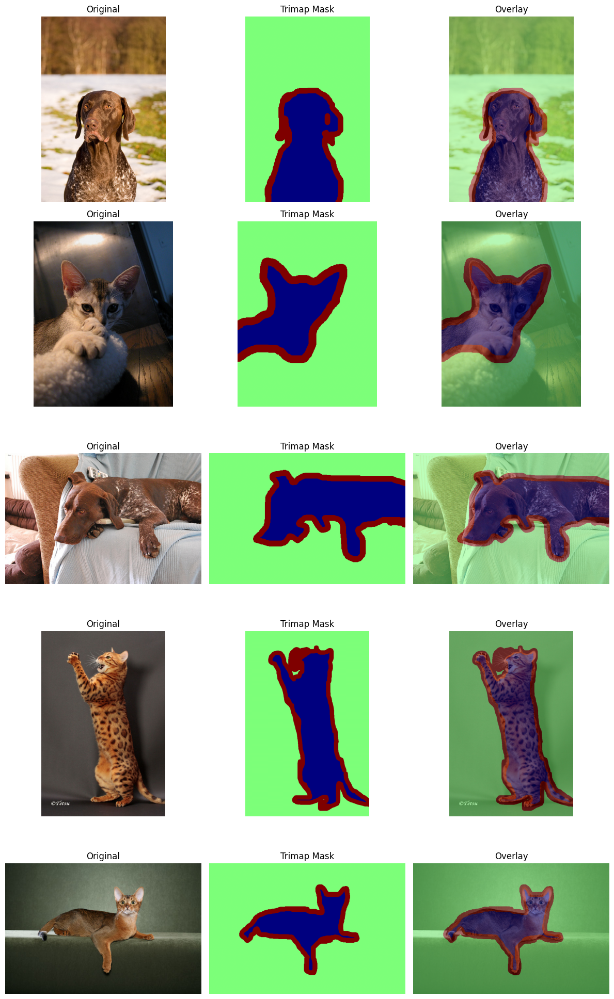

In [13]:
def visualize_samples(dataset, n=5):
    """
    Display n samples from the dataset.
    Each row: original image | trimap mask | overlay
    """
    samples = random.sample(dataset, n)
    fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
    # fig.suptitle("Dataset Samples: Image | Trimap Mask | Overlay", fontsize=14, fontweight='bold')

    for i, (img_path, mask_path) in enumerate(samples):
        img  = load_image(img_path)
        mask = load_mask(mask_path)

        # ── TODO 1 ──────────────────────────────────────────────────────────
        # Display the original image in axes[i, 0]
        # Display the trimap mask in axes[i, 1] with colormap 'jet'
        # Display a semi-transparent mask overlay on the image in axes[i, 2]
        # Add a title to each column
        # ────────────────────────────────────────────────────────────────────
        axes[i, 0].imshow(img)
        axes[i, 1].imshow(mask, cmap='jet')
        axes[i, 2].imshow(img)
        axes[i, 2].imshow(mask, cmap='jet', alpha=0.5)

        for j, title in enumerate(["Original", "Trimap Mask", "Overlay"]):
            axes[i, j].set_title(title)
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples(dataset, n=5)


### TODO 2 — Convert trimap to binary mask
The trimap has values 1 (pet), 2 (background), 3 (boundary).  
Convert it to a **binary mask**: `1` where the pixel is pet, `0` everywhere else.  
Treat boundary pixels (value 3) as foreground.


In [14]:
def trimap_to_binary(trimap):
    """
    Convert trimap mask to binary foreground mask.
    Args:
        trimap: numpy array with values 1 (pet), 2 (background), 3 (boundary)
    Returns:
        binary mask: numpy array with values 0 and 1
    """
    # ── TODO 2 ──────────────────────────────────────────────────────────────
    # Hint: use numpy boolean operations
    return ((trimap == 1) | (trimap == 3)).astype(np.uint8)
    # ────────────────────────────────────────────────────────────────────────

# Test
sample_mask = load_mask(dataset[0][1])
binary = trimap_to_binary(sample_mask)
print(f"Trimap unique values : {np.unique(sample_mask)}")
print(f"Binary unique values : {np.unique(binary)}")
print(f"Foreground pixels    : {binary.sum()} / {binary.size} ({100*binary.mean():.1f}%)")


Trimap unique values : [1 2 3]
Binary unique values : [0 1]
Foreground pixels    : 113634 / 224000 (50.7%)


### TODO 3 — Plot foreground pixel distribution
For each of the 50 images, compute the percentage of foreground pixels.  
Plot a **bar chart** showing this distribution across all images.  
Add a horizontal line showing the mean foreground percentage.


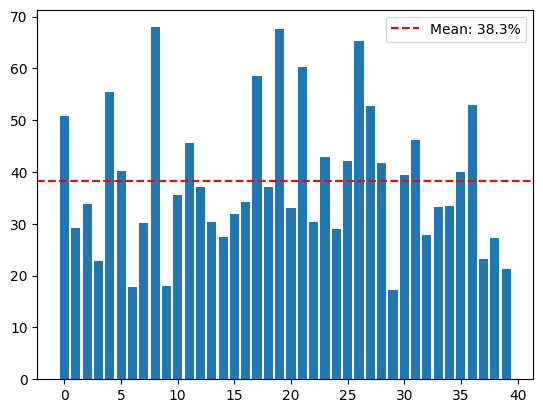

In [15]:
def plot_foreground_distribution(dataset):
    """
    For each image compute % of foreground pixels and plot as bar chart.
    """
    # ── TODO 3 ──────────────────────────────────────────────────────────────
    # 1. Loop over dataset, load each mask, convert to binary, compute fg %
    # 2. Store percentages in a list
    # 3. Add a red horizontal dashed line for the mean
    # ────────────────────────────────────────────────────────────────────────
    percentages = []
    for _, mask_path in dataset:
        binary = trimap_to_binary(load_mask(mask_path))
        percentages.append(100 * binary.mean())

    plt.bar(range(len(percentages)), percentages)
    plt.axhline(np.mean(percentages), color='red', linestyle='--', label=f'Mean: {np.mean(percentages):.1f}%')
    plt.legend()
    plt.show()

plot_foreground_distribution(dataset)





---
## Part 2 — Classical Segmentation: Why Naive Methods Fail

Before using SAM, we try two classical segmentation approaches:
- **Color thresholding** in HSV colorspace
- **Otsu's automatic thresholding** on grayscale

These methods require no learning, no data
But they have fundamental limitations, you will measure exactly how limited they are.


### TODO 4 — Color thresholding in HSV
Convert the image to HSV and threshold on the **saturation channel** to isolate the pet.  
Pets typically have higher saturation than backgrounds like grass or walls.


In [16]:
def color_threshold_segment(image_rgb):
    """
    Segment foreground using HSV saturation thresholding.
    Args:
        image_rgb: numpy array (H, W, 3) in RGB
    Returns:
        binary mask: numpy array (H, W) with values 0 and 1
    """
    # ── TODO 4 ──────────────────────────────────────────────────────────────
    # 1. Convert RGB image to HSV using cv2.cvtColor
    # 2. Extract the saturation channel (index 1)
    # 3. Apply a threshold: pixels with saturation > 60 are foreground
    # 4. Return binary mask (0 or 1, not 0 or 255)
    # ────────────────────────────────────────────────────────────────────────
    hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
    return (hsv[:, :, 1] > 60).astype(np.uint8)

# Test on one image
test_img = load_image(dataset[0][0])
pred = color_threshold_segment(test_img)
print(f"Predicted mask shape: {pred.shape}, unique: {np.unique(pred)}")


Predicted mask shape: (448, 500), unique: [0 1]


### TODO 5 — Morphological cleaning
Raw thresholding produces noisy masks with holes and isolated pixels.  
Apply **erosion followed by dilation** (opening) to clean the mask.


In [17]:
def morphological_clean(binary_mask, kernel_size=5, iterations=2):
    """
    Clean a binary mask using morphological opening (erosion then dilation).
    Args:
        binary_mask : numpy array (H, W) with values 0 and 1
        kernel_size : size of the structuring element
        iterations  : number of times to apply each operation
    Returns:
        cleaned binary mask
    """
    # ── TODO 5 ──────────────────────────────────────────────────────────────
    # 1. Create a kernel using cv2.getStructuringElement
    # 2. Convert mask to uint8 (multiply by 255)
    # 3. Apply cv2.erode() then cv2.dilate() with the kernel
    # 4. Convert back to binary (0 or 1) and return
    # ────────────────────────────────────────────────────────────────────────
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    mask = (binary_mask * 255).astype(np.uint8)
    mask = cv2.erode(mask, kernel, iterations=iterations)
    mask = cv2.dilate(mask, kernel, iterations=iterations)
    return (mask > 0).astype(np.uint8)


### TODO 6 — Visualize thresholding results
Show 3 images with: **original | predicted mask | colored overlay on image**.


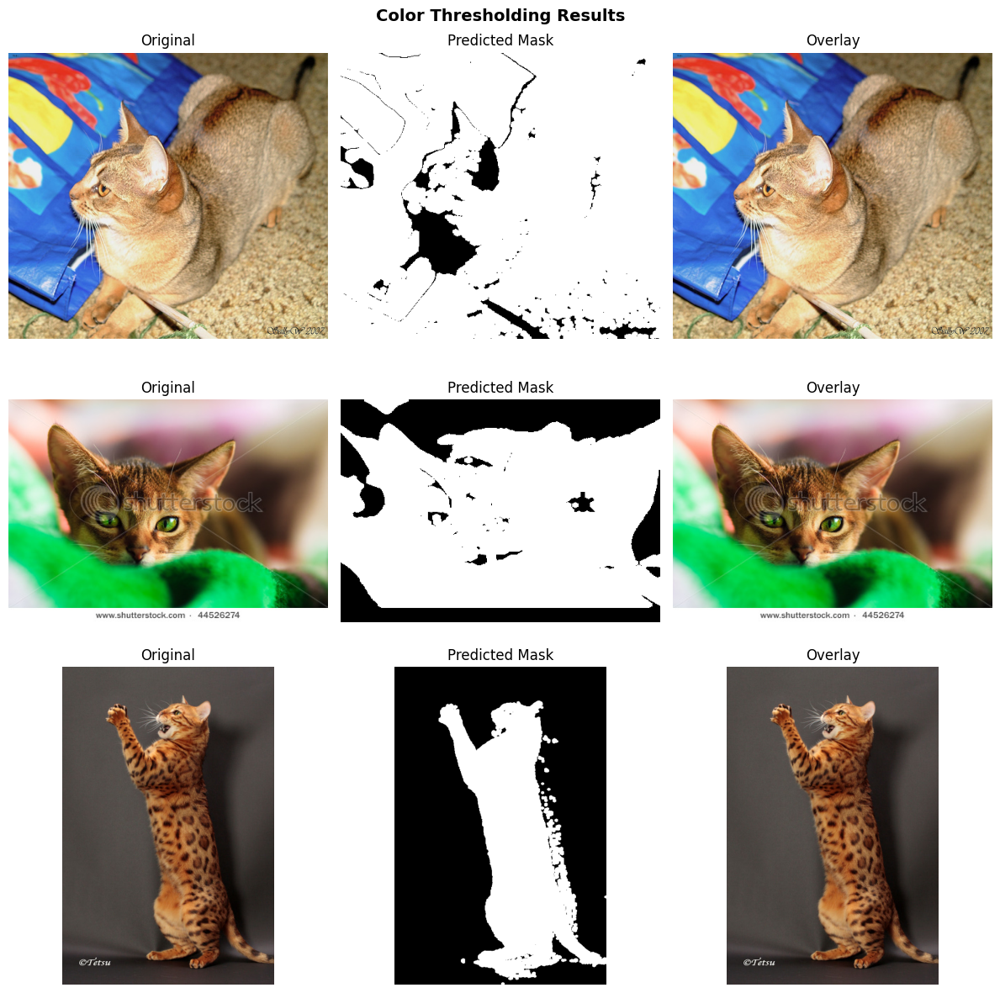

In [18]:
def visualize_classical(dataset, segment_fn, clean_fn, title, n=3):
    """
    Visualize classical segmentation results.
    Each row: original image | predicted mask | overlay
    """
    samples = dataset[:n]
    fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    for i, (img_path, mask_path) in enumerate(samples):
        img    = load_image(img_path)
        gt     = trimap_to_binary(load_mask(mask_path))
        pred   = clean_fn(segment_fn(img))

        # ── TODO 6 ──────────────────────────────────────────────────────────
        # Display: original image | predicted mask | overlay
        # Title each column: "Original", "Predicted Mask", "Overlay"
        # For the overlay: show image with semi-transparent mask on top
        # ────────────────────────────────────────────────────────────────────
        axes[i, 0].imshow(img)
        axes[i, 1].imshow(pred, cmap='gray')
        axes[i, 2].imshow(img)
        axes[i, 2].imshow(pred, cmap='jet', alpha=0.)

        for j, t in enumerate(["Original", "Predicted Mask", "Overlay"]):
            axes[i, j].set_title(t)
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

visualize_classical(dataset, color_threshold_segment, morphological_clean,
                    "Color Thresholding Results", n=3)


### TODO 7 — Otsu's automatic thresholding
Otsu's method automatically finds the optimal threshold on the **grayscale** image.  
It requires no manual parameter tuning.


In [19]:
def otsu_segment(image_rgb):
    """
    Segment foreground using Otsu's automatic thresholding on grayscale.
    Args:
        image_rgb: numpy array (H, W, 3) in RGB
    Returns:
        binary mask: numpy array (H, W) with values 0 and 1
    """
    # ── TODO 7 ──────────────────────────────────────────────────────────────
    # 1. Convert RGB to grayscale using cv2.cvtColor
    # 2. Apply Otsu thresholding: cv2.threshold with cv2.THRESH_OTSU flag
    # 3. Return binary mask (0 or 1)
    # ────────────────────────────────────────────────────────────────────────
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return (thresh > 0).astype(np.uint8)


### TODO 8 — Compare methods side by side
Display 5 images as a grid: **original | color threshold | Otsu | ground truth**  
4 columns, 5 rows.


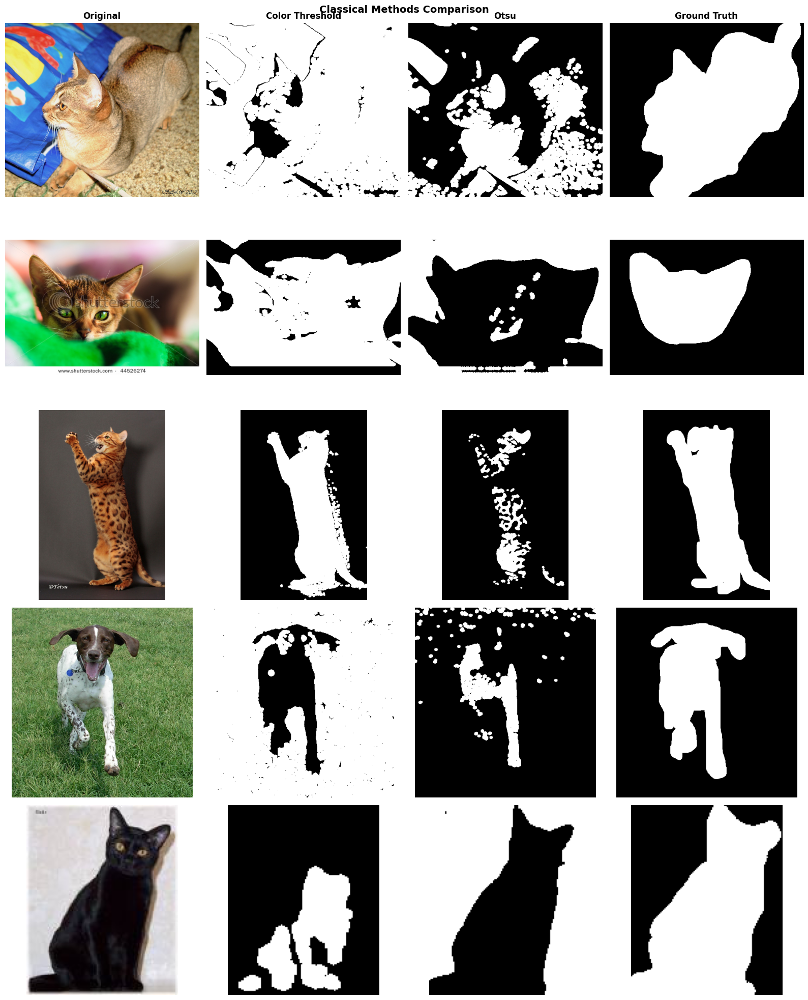

In [20]:
def compare_classical_methods(dataset, n=5):
    """
    Compare color thresholding vs Otsu vs ground truth.
    Grid: n rows x 4 columns (original, color thresh, otsu, ground truth)
    """
    samples = dataset[:n]
    fig, axes = plt.subplots(n, 4, figsize=(16, 4 * n))
    fig.suptitle("Classical Methods Comparison", fontsize=14, fontweight='bold')
    col_titles = ["Original", "Color Threshold", "Otsu", "Ground Truth"]

    for j, title in enumerate(col_titles):
        axes[0, j].set_title(title, fontsize=12, fontweight='bold')

    for i, (img_path, mask_path) in enumerate(samples):
        img    = load_image(img_path)
        gt     = trimap_to_binary(load_mask(mask_path))
        color  = morphological_clean(color_threshold_segment(img))
        otsu   = morphological_clean(otsu_segment(img))

        # ── TODO 8 ──────────────────────────────────────────────────────────
        # Display: original | color threshold mask | otsu mask | ground truth
        # Use cmap='gray' for masks
        # Turn off axes ticks for all subplots
        # ────────────────────────────────────────────────────────────────────
        axes[i, 0].imshow(img)
        axes[i, 1].imshow(color, cmap='gray')
        axes[i, 2].imshow(otsu, cmap='gray')
        axes[i, 3].imshow(gt, cmap='gray')

        for j in range(4):
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

compare_classical_methods(dataset, n=5)


---
## Part 3 — SAM ViT-B

We now move to the Segment Anything Model. SAM takes an image and a **prompt** as input and returns a precise mask.

Three prompt strategies, three exercises:
- **3A** — Point prompt: click on the object
- **3B** — Box prompt: draw a bounding box around the object
- **3C** — Automatic: no prompt at all — SAM segments everything


In [21]:
# ── Load SAM ViT-B ───────────────────────────────────
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
CHECKPOINT = "sam_vit_b_01ec64.pth"

sam = sam_model_registry["vit_b"](checkpoint=CHECKPOINT)
sam.eval()
sam.to(DEVICE)

predictor = SamPredictor(sam)
print(f"✅ SAM ViT-B loaded on {DEVICE}")


✅ SAM ViT-B loaded on cuda


### Exercise 3A — Point Prompt
**The idea:** you click one point on the pet. SAM returns three candidate masks ranked by confidence.  
You then pick the best one.


#### TODO 9 — Encode the image into SAM's embedding
Call `predictor.set_image()` to compute the image embedding.  
This is the expensive step — it runs the ViT-B encoder once per image.


In [22]:
TEST_INDICES = [0, 1, 2]

test_images = [
    (load_image(dataset[i][0]), trimap_to_binary(load_mask(dataset[i][1])), dataset[i][0].name)
    for i in TEST_INDICES
]

test_img, test_gt, _ = test_images[0]
predictor.set_image(test_img)

print(f"{len(test_images)} images loaded")

3 images loaded


#### TODO 10 — Define a point prompt
Define a single foreground point at the **center of the image**.  
SAM expects points as numpy arrays of shape `(N, 2)` and labels as `(N,)`.  
Label `1` = foreground, `0` = background.


In [23]:
# ── TODO 10 ─────────────────────────────────────────────────────────────────
# Define:
#   point_coords: numpy array shape (1, 2) with [x, y] at image center
#   point_labels: numpy array shape (1,) with value 1 (foreground)
# Hint: image center is at (width//2, height//2)
#       image shape is (H, W, C) so width = test_img.shape[1], height = test_img.shape[0]

h, w = test_img.shape[:2]
point_coords = np.array([[w // 2, h // 2]])
point_labels = np.array([1])
# ────────────────────────────────────────────────────────────────────────────

print(f"Point coords : {point_coords}")
print(f"Point labels : {point_labels}")


Point coords : [[250 224]]
Point labels : [1]


#### TODO 11 — Run SAM prediction with point prompt
Call `predictor.predict()` with your point coordinates and labels.  
Collect the three output masks and their IoU scores.


In [24]:
# ── TODO 11 ─────────────────────────────────────────────────────────────────
# Call predictor.predict() with:
#   point_coords = point_coords
#   point_labels = point_labels
#   multimask_output = True  ← always True to get 3 masks
# The function returns: masks, scores, logits
# masks shape: (3, H, W) — three binary masks
# scores shape: (3,) — confidence score for each mask

masks, scores, logits = predictor.predict(
    point_coords=point_coords,
    point_labels=point_labels,
    multimask_output=True
)
# ────────────────────────────────────────────────────────────────────────────

print(f"Masks shape  : {masks.shape}")
print(f"IoU scores   : {scores.round(3)}")


Masks shape  : (3, 448, 500)
IoU scores   : [0.782 0.703 0.923]


#### TODO 12 — Visualize the three SAM masks
Display the three masks SAM returned, each with its confidence score as title.  
Use a colored semi-transparent overlay on the original image.


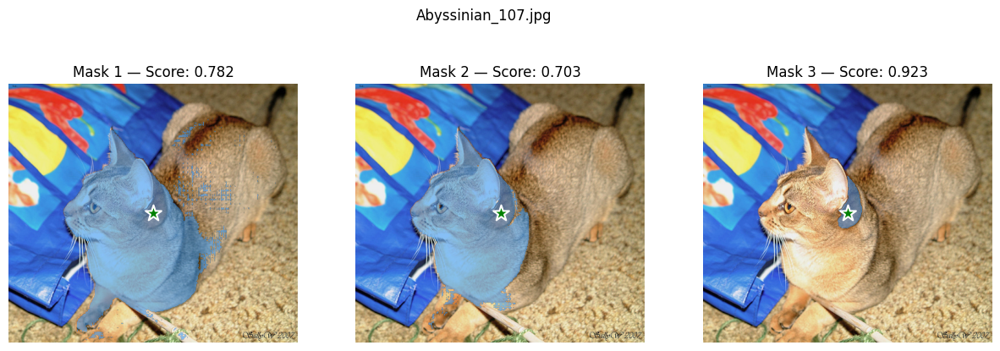

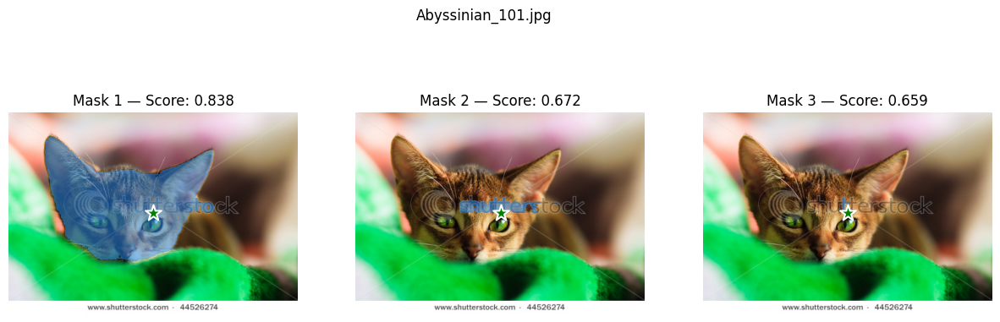

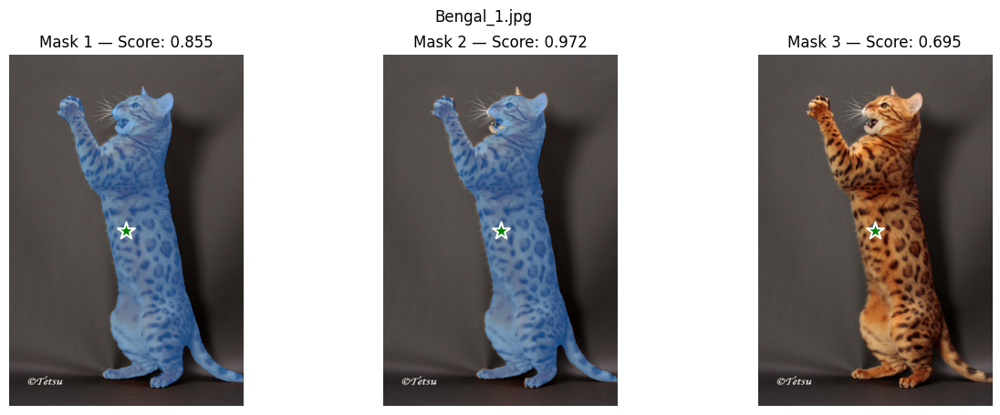

In [25]:
def show_mask(mask, ax, color=None, alpha=0.5):
    """Overlay a binary mask on an existing axes with a given color."""
    if color is None:
        color = np.array([30/255, 144/255, 255/255])
    h, w = mask.shape
    mask_img = np.zeros((h, w, 4))
    mask_img[mask == 1] = [*color, alpha]
    ax.imshow(mask_img)

def show_point(coords, labels, ax):
    """Draw prompt points on axes (green=fg, red=bg)."""
    for coord, label in zip(coords, labels):
        color = 'green' if label == 1 else 'red'
        ax.scatter(coord[0], coord[1], c=color, s=200, marker='*',
                   edgecolors='white', linewidths=1.5, zorder=5)

# ── TODO 12 ─────────────────────────────────────────────────────────────────
# Create a figure with 1 row and 3 columns
# For each of the 3 masks:
#   - Display test_img as background
#   - Call show_mask() to overlay the mask
#   - Call show_point() to show the prompt point
#   - Set title to f"Mask {i+1} — Score: {scores[i]:.3f}"
# Add a main title: "SAM Point Prompt — 3 Output Masks"

for img, gt, name in test_images:
    h, w = img.shape[:2]
    pt_coords = np.array([[w // 2, h // 2]])
    pt_labels = np.array([1])

    predictor.set_image(img)
    masks, scores, _ = predictor.predict(
        point_coords=pt_coords,
        point_labels=pt_labels,
        multimask_output=True
    )

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(name)
    for i in range(3):
        axes[i].imshow(img)
        show_mask(masks[i].astype(int), axes[i])
        show_point(pt_coords, pt_labels, axes[i])
        axes[i].set_title(f"Mask {i+1} — Score: {scores[i]:.3f}")
        axes[i].axis('off')
    plt.show()

# ────────────────────────────────────────────────────────────────────────────


### Prompt Placement Experiment

The default strategy uses the center of the image `(w//2, h//2)` as the point prompt.
This is a naive heuristic : the animal is not always centered.

We manually adjusted the prompt position for each image based on visual inspection.

For each prompt position, SAM returns 3 mask candidates (`multimask_output=True`).
We automatically select the one with the highest internal confidence score:

```python
best_mask = masks[np.argmax(scores)]
```

This shows that prompt placement is critical: a point on the background produces a mask
of the background, not the animal, regardless of SAM's confidence score.
The IoU vs ground truth confirms this: SAM can be very confident (score > 0.9)
while being completely wrong (IoU < 0.05).

Another issue appears in Abyssinian_101: the image contains a Shutterstock watermark.
SAM segments it confidently because the watermark pixels form a coherent visual region.
The internal score is high but the IoU is low: SAM is doing its job correctly
but on the wrong object. This highlights a fundamental limitation: SAM has no notion
of semantic relevance. It segments whatever region is visually consistent with the prompt,
not necessarily what we care about.

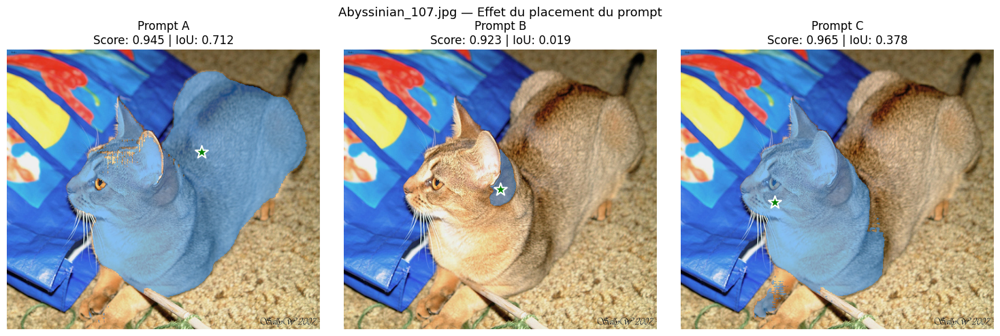

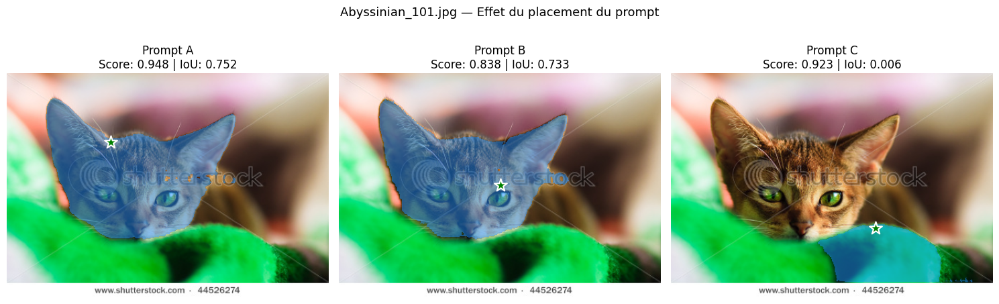

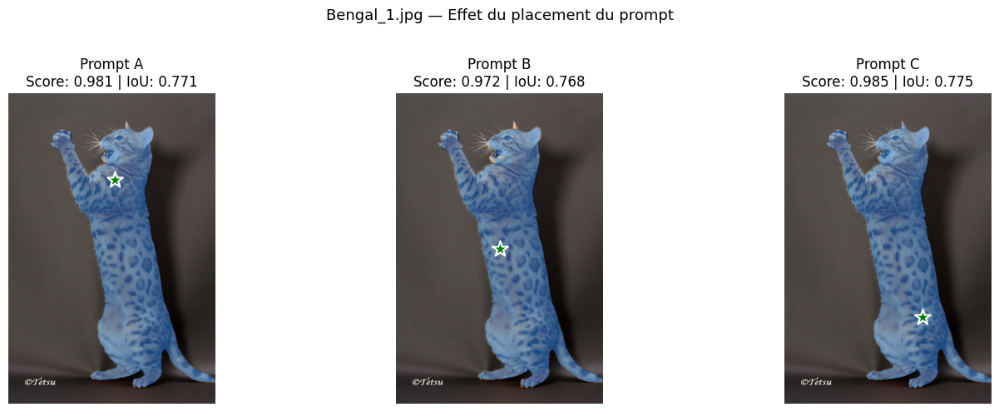

In [38]:
def compute_iou(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    if union == 0:
        return 1.0
    return float(intersection / union)

# Prompt displacement experiment
offsets = {
    "Abyssinian_107.jpg": [(60, -60), (0, 0), (-100, 20)],
    "Abyssinian_101.jpg": [(-80, -60), (0, 0), (60, 60)],
    "Bengal_1.jpg":       [(10, -200),   (0, 0), (100, 200)],
}
labels_titles = ["Prompt A", "Prompt B", "Prompt C"]

for img, gt, name in test_images:
    h, w = img.shape[:2]
    cx, cy = w // 2, h // 2
    deltas = offsets.get(name, [(0, 0), (-80, -80), (80, 80)])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"{name} — Effet du placement du prompt\n", fontsize=13)

    for i, (dx, dy) in enumerate(deltas):
        pt_coords = np.array([[cx + dx, cy + dy]])
        pt_labels = np.array([1])

        predictor.set_image(img)
        masks, scores, _ = predictor.predict(
            point_coords=pt_coords,
            point_labels=pt_labels,
            multimask_output=True
        )
        best_mask = masks[np.argmax(scores)]
        iou = compute_iou(best_mask.astype(bool), gt.astype(bool))

        axes[i].imshow(img)
        show_mask(best_mask.astype(int), axes[i])
        show_point(pt_coords, pt_labels, axes[i])
        axes[i].set_title(f"{labels_titles[i]}\nScore: {scores.max():.3f} | IoU: {iou:.3f}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

### Reflection — Point Prompt
**Q: SAM returned three masks. Which one is best? Why did SAM return three instead of one?**

**Which one is best?**

There is no single best mask across all images. The best mask varies per image and
per prompt position. We select it automatically using the highest internal confidence
score (`np.argmax(scores)`), but this score is not always aligned with actual quality
measured by IoU vs ground truth. SAM can return a high confidence score while
segmenting the wrong region entirely.

**Why three instead of one?**

A single point is ambiguous: it does not specify the scale of the object to segment.
SAM returns three masks at different granularities (part, object, full scene) to handle
this ambiguity. The user or downstream system is expected to pick the most relevant one.

**Key limitation**

SAM has no semantic understanding. It segments whatever visual region is consistent
with the prompt, not what is meaningful to us. A point on the background segments
the background. A point on a watermark segments the watermark. The model cannot
distinguish between "the cat" and "a visually coherent region that happens to not be the cat".
This is why the prompt placement is critical.

---
### Exercise 3B — Box Prompt
**The idea:** instead of a point, we give SAM a bounding box around the pet.  
We compute this box automatically from the ground truth mask.


#### TODO 13 — Compute bounding box from ground truth mask
Find the tight bounding box around the foreground region of the binary mask.  
SAM expects boxes as `[x_min, y_min, x_max, y_max]`.


In [39]:
def mask_to_bbox(binary_mask):
    """
    Compute bounding box of foreground region in a binary mask.
    Args:
        binary_mask: numpy array (H, W) with values 0 and 1
    Returns:
        numpy array [x_min, y_min, x_max, y_max]
    """
    # ── TODO 13 ─────────────────────────────────────────────────────────────
    # Use np.where to find rows and columns where mask == 1
    # x_min = cols.min(), x_max = cols.max()
    # y_min = rows.min(), y_max = rows.max()
    # Return as numpy array: np.array([x_min, y_min, x_max, y_max])
    # ────────────────────────────────────────────────────────────────────────

    rows, cols = np.where(binary_mask == 1)
    return np.array([cols.min(), rows.min(), cols.max(), rows.max()])

# Test
bbox = mask_to_bbox(test_gt)
print(f"Bounding box: {bbox}")


Bounding box: [ 82   0 491 447]


#### TODO 14 — Run SAM with box prompt
Pass the bounding box to `predictor.predict()` using the `box` argument.


In [40]:
# ── TODO 14 ─────────────────────────────────────────────────────────────────
# Call predictor.predict() with:
#   box = bbox[None, :]   ← SAM expects shape (1, 4)
#   multimask_output = False  ← box prompts usually return 1 mask
# Collect masks, scores, logits
# ────────────────────────────────────────────────────────────────────────────

masks, scores, logits = predictor.predict(
    box=bbox[None, :],
    multimask_output=False
)

box_mask = masks[0]
print(f"Box mask shape: {box_mask.shape}, score: {scores[0]:.3f}")


Box mask shape: (901, 600), score: 0.911


#### TODO 15 — Compare point vs box prompt vs ground truth
Display 3 images side by side: **point prompt result | box prompt result | ground truth**  
Do this for 3 different images from the dataset.


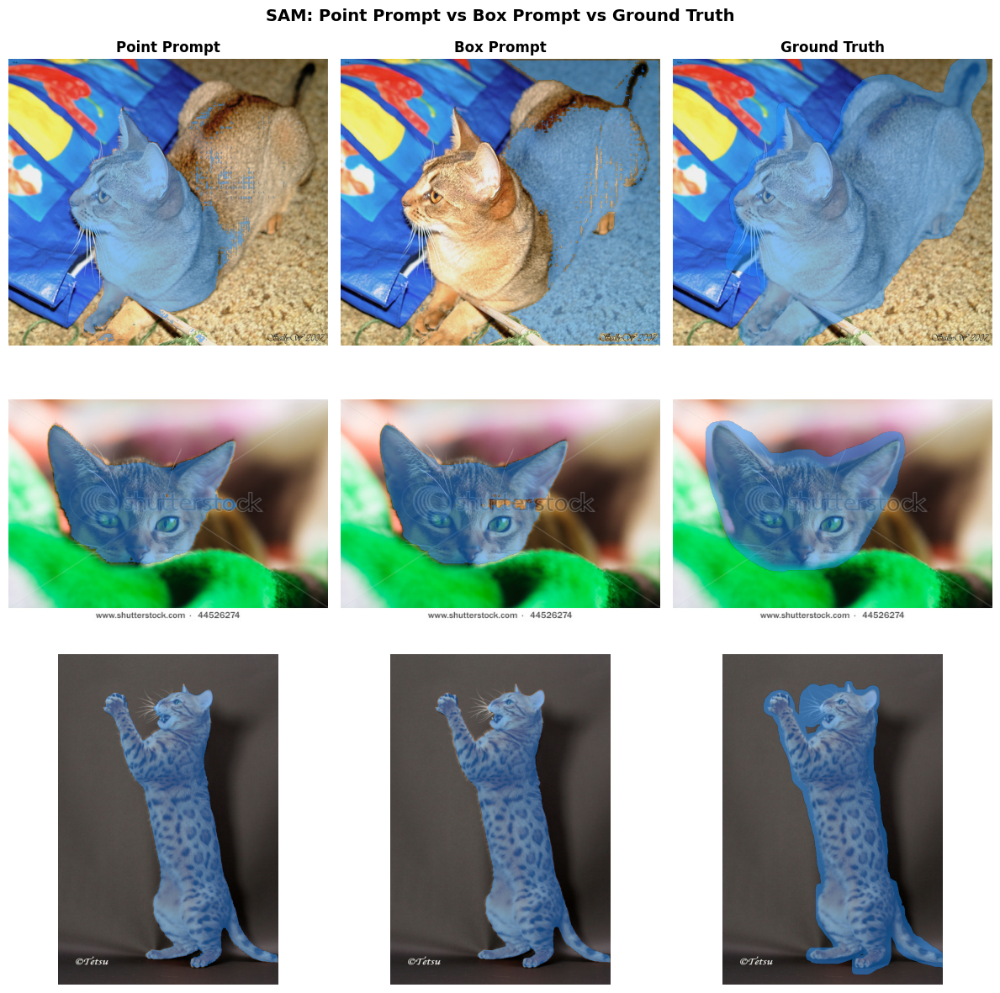

In [41]:
def compare_prompts(dataset, predictor, n=3):
    fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))
    fig.suptitle("SAM: Point Prompt vs Box Prompt vs Ground Truth", fontsize=14, fontweight='bold')

    for j, t in enumerate(["Point Prompt", "Box Prompt", "Ground Truth"]):
        axes[0, j].set_title(t, fontsize=12, fontweight='bold')

    for i, (img_path, mask_path) in enumerate(dataset[:n]):
        img = load_image(img_path)
        gt  = trimap_to_binary(load_mask(mask_path))
        box = mask_to_bbox(gt)

        predictor.set_image(img)

        h, w = img.shape[:2]
        pt_masks, _, _ = predictor.predict(
            point_coords=np.array([[w // 2, h // 2]]),
            point_labels=np.array([1]),
            multimask_output=True
        )
        bx_masks, _, _ = predictor.predict(
            box=box[None, :],
            multimask_output=False
        )

        for j, mask in enumerate([pt_masks[0], bx_masks[0], gt]):
            axes[i, j].imshow(img)
            show_mask(mask.astype(int), axes[i, j])
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

compare_prompts(dataset, predictor, n=3)

---
### Exercise 3C — Automatic Mask Generation
**The idea:** no prompt at all. SAM runs on a grid of points and segments everything it finds.


In [42]:
# ── Automatic mask generator — given, do not modify ────────────────────────
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=8,           # reduced for CPU speed
    pred_iou_thresh=0.88,
    stability_score_thresh=0.95,
    min_mask_region_area=500,
)
print(" Automatic mask generator ready")


 Automatic mask generator ready


In [48]:
# other mask generator

mask_generator_medium = SamAutomaticMaskGenerator(
    model=sam, points_per_side=8,
    pred_iou_thresh=0.75, stability_score_thresh=0.85, min_mask_region_area=300
)

mask_generator_loose = SamAutomaticMaskGenerator(
    model=sam, points_per_side=8,
    pred_iou_thresh=0.60, stability_score_thresh=0.70, min_mask_region_area=100
)

print("Generators ready")


Generators ready


#### TODO 16 — Run automatic mask generation
Run the mask generator on one image and collect all detected masks.


In [49]:
# ── TODO 16 ─────────────────────────────────────────────────────────────────
# Call mask_generator.generate(auto_img) and store the result in `auto_masks`
auto_data = []
for img_path, _ in dataset[:3]:
    img = load_image(img_path)
    masks_strict = mask_generator.generate(img)
    masks_medium = mask_generator_medium.generate(img)
    masks_loose  = mask_generator_loose.generate(img)
    auto_data.append((img, masks_strict, masks_medium, masks_loose, img_path.name))
    print(f"{img_path.name} — strict: {len(masks_strict)} | medium: {len(masks_medium)} | loose: {len(masks_loose)}")

img, ms, mm, ml, name = auto_data[0]
print(f"Keys: {list(ms[0].keys())}")
# ────────────────────────────────────────────────────────────────────────────



Abyssinian_107.jpg — strict: 8 | medium: 22 | loose: 31
Abyssinian_101.jpg — strict: 7 | medium: 20 | loose: 24
Bengal_1.jpg — strict: 3 | medium: 9 | loose: 12
Keys: ['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box']


#### TODO 17 — Visualize all automatic masks
Write a function that draws each mask with a different random color overlaid on the image.


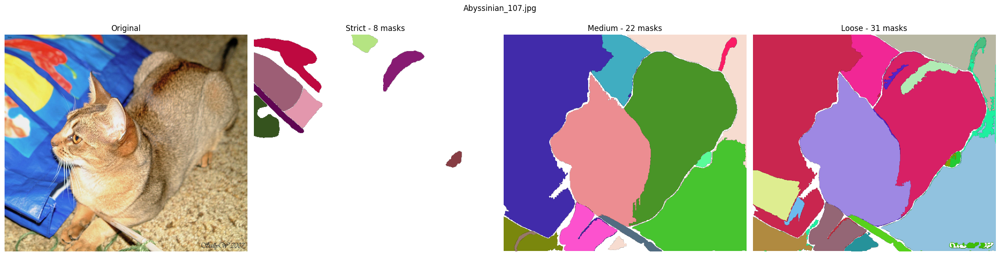

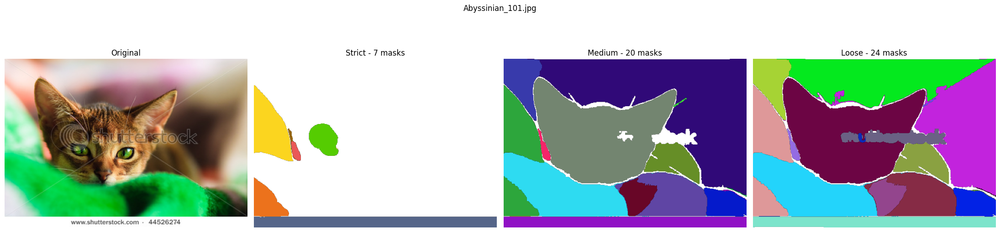

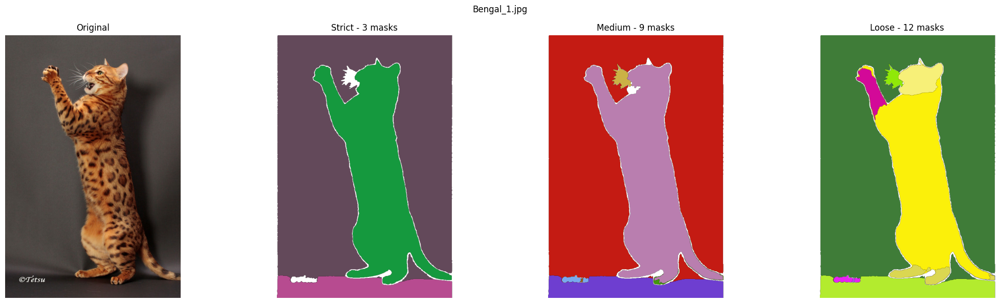

In [52]:
def show_all_masks(image, masks_strict, masks_medium, masks_loose, title="Automatic Masks"):
    fig, axes = plt.subplots(1, 4, figsize=(22, 6))
    fig.suptitle(title)

    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[0].axis('off')

    for ax, masks, label in zip(axes[1:], [masks_strict, masks_medium, masks_loose],
                                ["Strict", "Medium", "Loose"]):
        ax.imshow(np.ones_like(image) * 255)
        for mask in masks:
            show_mask(mask['segmentation'].astype(int), ax, color=np.random.rand(3), alpha=1)
        ax.set_title(f"{label} - {len(masks)} masks")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

for img, ms, mm, ml, name in auto_data:
    show_all_masks(img, ms, mm, ml, name)

#### TODO 18 — Sort masks by confidence and display top 3
Sort all automatic masks by their `predicted_iou` score (descending).  
Display the top 3 individually with their score and area.



Abyssinian_107.jpg [Strict] — 8 masks found


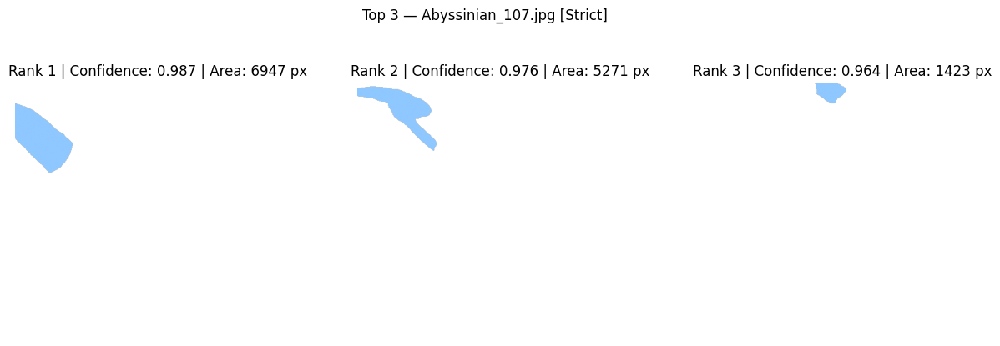


Abyssinian_107.jpg [Medium] — 22 masks found


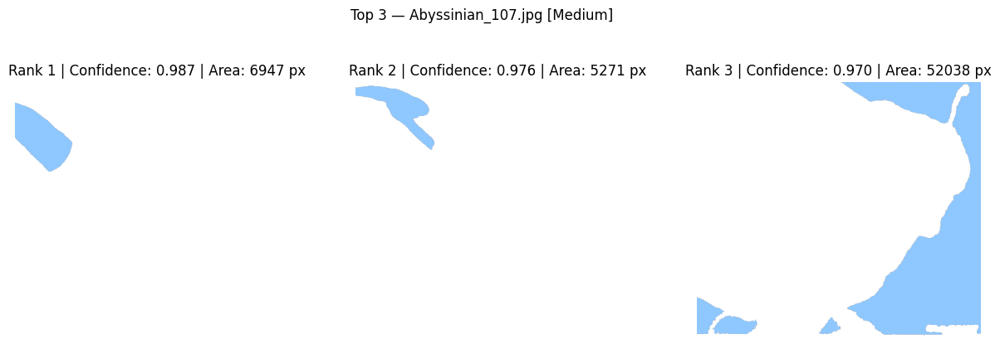


Abyssinian_107.jpg [Loose] — 31 masks found


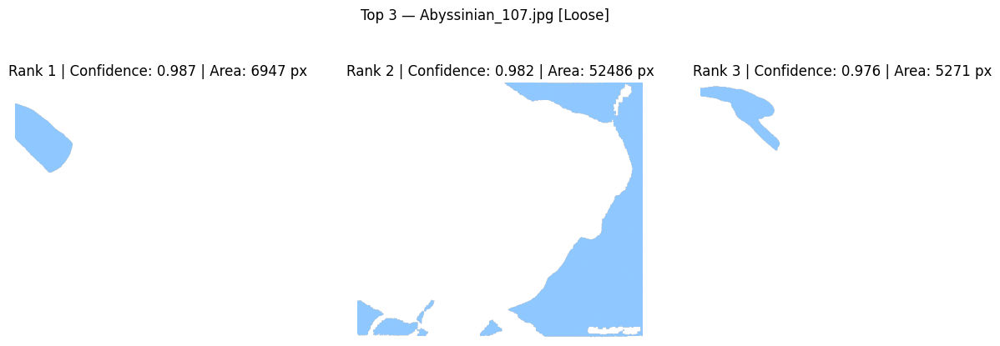


Abyssinian_101.jpg [Strict] — 7 masks found


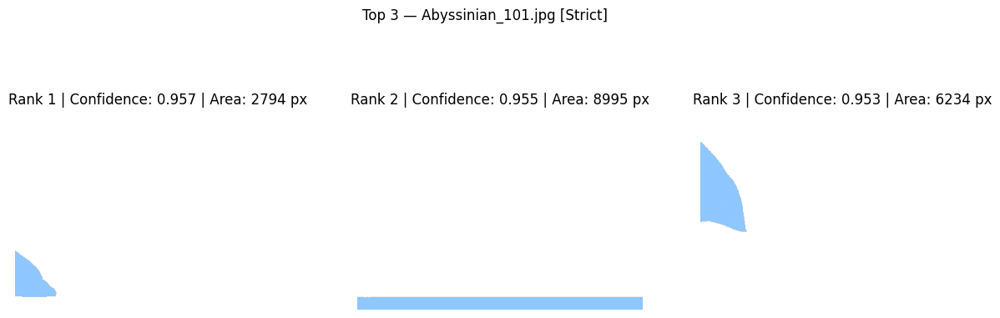


Abyssinian_101.jpg [Medium] — 20 masks found


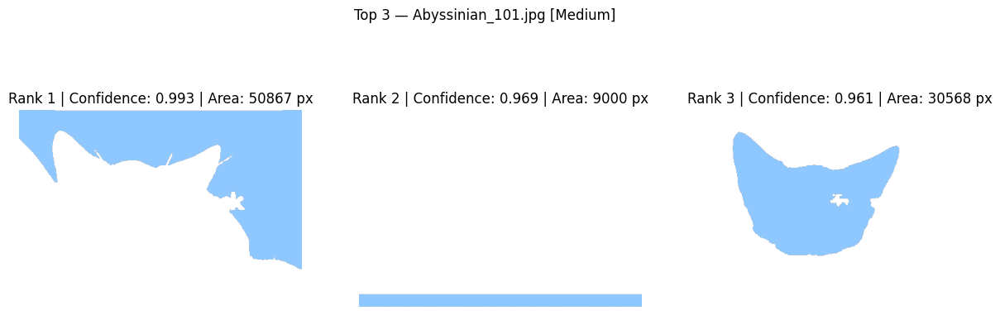


Abyssinian_101.jpg [Loose] — 24 masks found


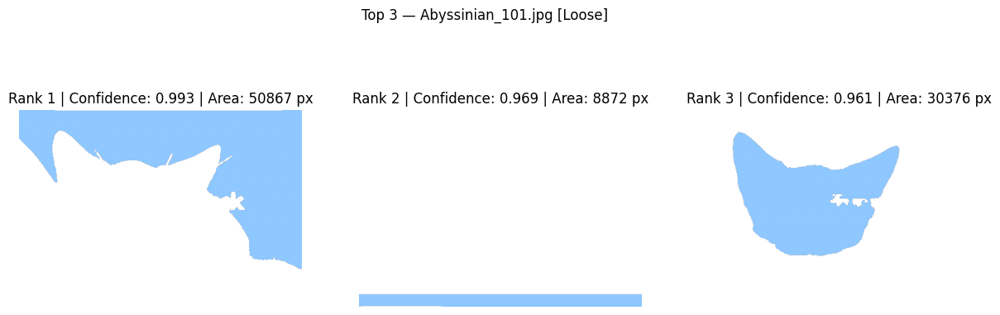


Bengal_1.jpg [Strict] — 3 masks found


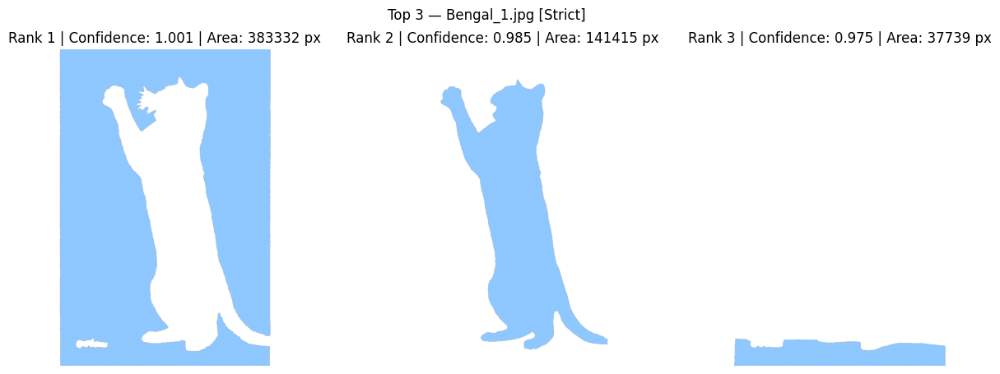


Bengal_1.jpg [Medium] — 9 masks found


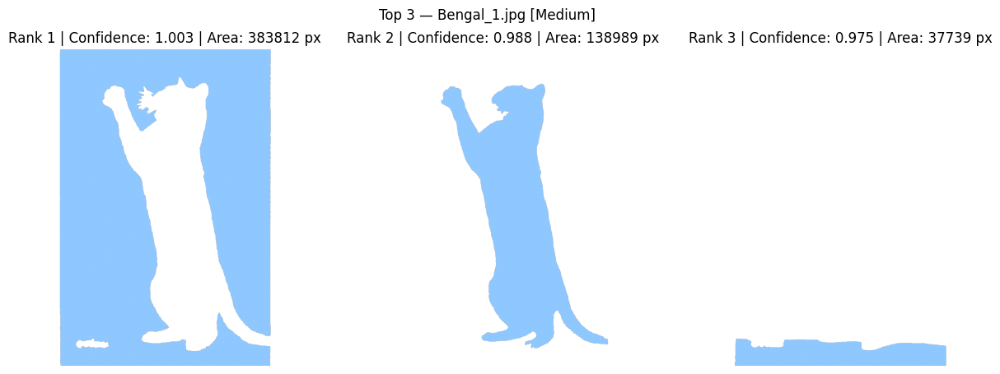


Bengal_1.jpg [Loose] — 12 masks found


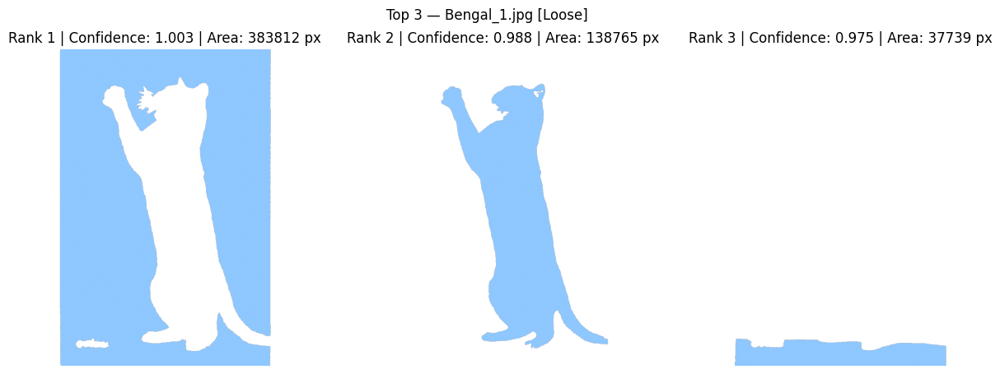

In [56]:
# ── TODO 18 ─────────────────────────────────────────────────────────────────
# 1. Print total number of masks found
# 2. Sort auto_masks by 'predicted_iou' descending
# 3. Display top 3 masks individually (3 columns)
#    Each subplot: original image + one mask overlay
#    Title: f"Rank {i+1} | IoU: {m['predicted_iou']:.3f} | Area: {m['area']} px"

for img, ms, mm, ml, name in auto_data:
    for masks, label in [(ms, "Strict"), (mm, "Medium"), (ml, "Loose")]:
        print(f"\n{name} [{label}] — {len(masks)} masks found")
        sorted_masks = sorted(masks, key=lambda m: m['predicted_iou'], reverse=True)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f"Top 3 — {name} [{label}]")
        for i, m in enumerate(sorted_masks[:3]):
            # fond blanc + masque seul sans image derriere
            axes[i].imshow(np.ones_like(img) * 255)
            show_mask(m['segmentation'].astype(int), axes[i])
            axes[i].set_title(f"Rank {i+1} | Confidence: {m['predicted_iou']:.3f} | Area: {m['area']} px")
            axes[i].axis('off')
        plt.show()

# ────────────────────────────────────────────────────────────────────────────

### ✍️ Reflection — Automatic Generation
**Q: SAM found N masks automatically. Are all of them meaningful?
What determines whether a region gets its own mask?**

No, not all masks are meaningful for our task. SAM segments any visually coherent region,regardless of semantic relevance. On our images, the top  confidence masks correspond to small patches of the background (blue fabric, floor texture) rather than the animal itself.

A region gets its own mask if it passes three thresholds:
- `pred_iou_thresh`: SAM's internal confidence that the mask is clean
- `stability_score_thresh`: the mask stays consistent when the binarization threshold varies
- `min_mask_region_area`: the region is large enough to not be noise

Lowering these thresholds (Medium/Loose generators) produces more masks but also more
irrelevant regions. The fundamental issue is that SAM has no notion of "what matters". In fact, it segments what is visually separable, not what is semantically relevant. For portrait-style animal images with uniform or blurred backgrounds, automatic generation
performs poorly compared to prompted approaches.

---
## Part 4 — Metrics: Measuring What We See

You have seen IoU and DICE in the lecture. Now implement them from scratch  
and use them to rigorously compare all three segmentation approaches.

Recall:
$$\text{IoU}(A, B) = \frac{|A \cap B|}{|A \cup B|}$$

$$\text{DICE}(A, B) = \frac{2|A \cap B|}{|A| + |B|}$$


### TODO 19 — Implement IoU from scratch


In [57]:
def compute_iou(pred_mask, gt_mask):
    """
    Compute Intersection over Union between two binary masks.
    Args:
        pred_mask: numpy array (H, W) with values 0 and 1
        gt_mask  : numpy array (H, W) with values 0 and 1
    Returns:
        float in [0, 1]
    """
    # ── TODO 19 ─────────────────────────────────────────────────────────────

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    if union == 0:
        return 1.0
    return float(intersection / union)
    # ────────────────────────────────────────────────────────────────────────

#  checks
perfect = np.array([[1, 1, 0], [0, 1, 0]])
assert compute_iou(perfect, perfect) == 1.0, "Perfect overlap should give IoU=1"
empty   = np.zeros_like(perfect)
assert compute_iou(perfect, empty)   == 0.0, "No overlap should give IoU=0"
print("✅ IoU sanity checks passed")


✅ IoU sanity checks passed


### TODO 20 — Implement DICE from scratch


In [58]:
def compute_dice(pred_mask, gt_mask):
    """
    Compute DICE score between two binary masks.
    Args:
        pred_mask: numpy array (H, W) with values 0 and 1
        gt_mask  : numpy array (H, W) with values 0 and 1
    Returns:
        float in [0, 1]
    """
    # ── TODO 20 ─────────────────────────────────────────────────────────────

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    total = pred_mask.sum() + gt_mask.sum()
    if total == 0:
        return 1.0
    return float(2 * intersection / total)
    # ────────────────────────────────────────────────────────────────────────

#  checks
assert compute_dice(perfect, perfect) == 1.0, "Perfect overlap should give DICE=1"
assert compute_dice(perfect, empty)   == 0.0, "No overlap should give DICE=0"
print("✅ DICE sanity checks passed")


✅ DICE sanity checks passed


### TODO 21 — Evaluate all three methods on 50 images
Compute mean IoU and mean DICE for:
- Color thresholding
- SAM point prompt (center point)
- SAM box prompt (from ground truth bbox)


In [59]:
def evaluate_method(dataset, predictor, method="color", n=50):
    ious, dices = [], []
    print(f"Evaluating: {method} ...")

    for img_path, mask_path in dataset[:n]:
        img = load_image(img_path)
        gt  = trimap_to_binary(load_mask(mask_path))

        if method == "color":
            pred = morphological_clean(color_threshold_segment(img))

        elif method == "otsu":
            pred = morphological_clean(otsu_segment(img))

        elif method == "sam_point":
            predictor.set_image(img)
            h, w = img.shape[:2]
            pt_masks, _, _ = predictor.predict(
                point_coords=np.array([[w // 2, h // 2]]),
                point_labels=np.array([1]),
                multimask_output=True
            )
            pred = pt_masks[0].astype(np.uint8)

        elif method == "sam_box":
            predictor.set_image(img)
            box = mask_to_bbox(gt)
            bx_masks, _, _ = predictor.predict(
                box=box[None, :],
                multimask_output=False
            )
            pred = bx_masks[0].astype(np.uint8)

        if pred.shape != gt.shape:
            pred = cv2.resize(pred.astype(np.uint8), (gt.shape[1], gt.shape[0]))

        ious.append(compute_iou(pred.astype(bool), gt.astype(bool)))
        dices.append(compute_dice(pred.astype(bool), gt.astype(bool)))

    return {"iou": ious, "dice": dices}

results = {
    "Color Threshold": evaluate_method(dataset, predictor, method="color"),
    "Otsu":            evaluate_method(dataset, predictor, method="otsu"),
    "SAM Point":       evaluate_method(dataset, predictor, method="sam_point"),
    "SAM Box":         evaluate_method(dataset, predictor, method="sam_box"),
}


Evaluating: color ...
Evaluating: otsu ...
Evaluating: sam_point ...
Evaluating: sam_box ...


In [60]:
# ── Print results table (given — run after TODO 21) ─────────────────────────
print("\n" + "="*55)
print(f"{'Method':<20} {'Mean IoU':>10} {'Mean DICE':>10}")
print("="*55)
for method_name, res in results.items():
    print(f"{method_name:<20} {np.mean(res['iou']):>10.3f} {np.mean(res['dice']):>10.3f}")
print("="*55)



Method                 Mean IoU  Mean DICE
Color Threshold           0.319      0.451
Otsu                      0.141      0.231
SAM Point                 0.627      0.726
SAM Box                   0.740      0.831


### TODO 22 — Plot results
Two plots:
1. **Bar chart** comparing mean IoU across all methods
2. **Scatter plot** of per-image IoU: SAM point vs SAM box (one dot per image)


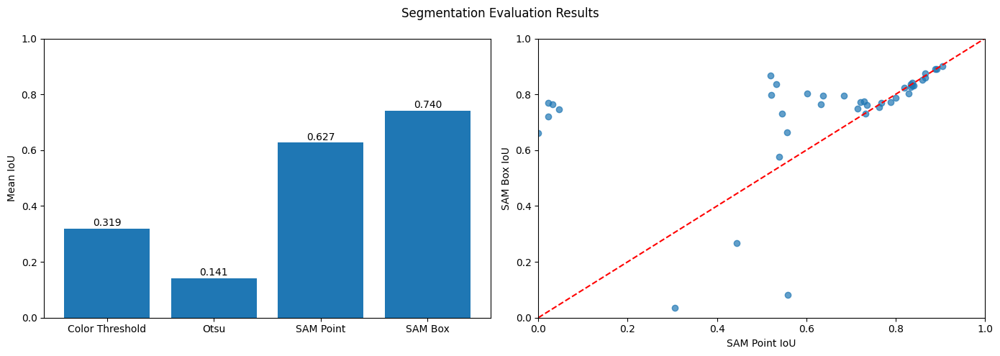

In [61]:
def plot_results(results):
    """
    Plot 1: bar chart of mean IoU per method
    Plot 2: scatter plot SAM point vs SAM box per image
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Segmentation Evaluation Results")

    methods   = list(results.keys())
    mean_ious = [np.mean(results[m]['iou']) for m in methods]
    bars = axes[0].bar(methods, mean_ious)
    axes[0].set_ylim(0, 1)
    axes[0].set_ylabel("Mean IoU")
    for bar, val in zip(bars, mean_ious):
        axes[0].text(bar.get_x() + bar.get_width()/2, val + 0.01, f'{val:.3f}', ha='center')

    point_ious = results["SAM Point"]["iou"]
    box_ious   = results["SAM Box"]["iou"]
    axes[1].scatter(point_ious, box_ious, alpha=0.7)
    axes[1].plot([0, 1], [0, 1], 'r--')
    axes[1].set_xlabel("SAM Point IoU")
    axes[1].set_ylabel("SAM Box IoU")
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()

plot_results(results)


### TODO 23 — Failure analysis
Find the 3 images where SAM box prompt got the **lowest IoU**.  
Display each with: original image | SAM box mask | ground truth | IoU score as title.  
Write 3 sentences below explaining what went wrong visually.


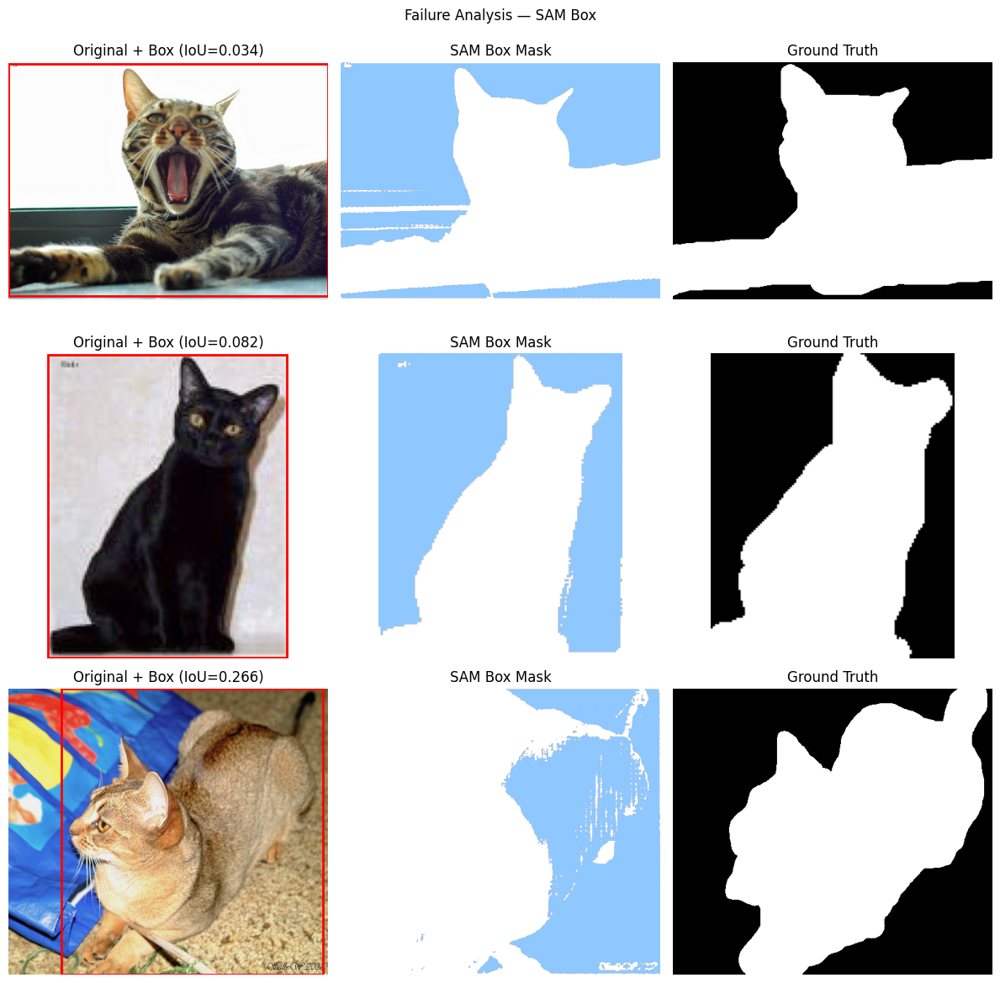

In [65]:
def failure_analysis(dataset, predictor, results, method_key="SAM Box", n_failures=3):
    """
    Find n worst predictions and display them.
    """
    ious = results[method_key]["iou"]
    worst_indices = np.argsort(ious)[:n_failures]

    fig, axes = plt.subplots(n_failures, 3, figsize=(12, 4 * n_failures))
    fig.suptitle(f"Failure Analysis — {method_key}")

    for row, idx in enumerate(worst_indices):
        img_path, mask_path = dataset[idx]
        img = load_image(img_path)
        gt  = trimap_to_binary(load_mask(mask_path))
        box = mask_to_bbox(gt)

        predictor.set_image(img)
        bx_masks, _, _ = predictor.predict(box=box[None, :], multimask_output=False)
        pred = bx_masks[0]

        # affichage image + bounding box
        axes[row, 0].imshow(img)
        x0, y0, x1, y1 = box
        rect = patches.Rectangle((x0, y0), x1-x0, y1-y0,
                                  linewidth=2, edgecolor='red', facecolor='none')
        axes[row, 0].add_patch(rect)
        axes[row, 0].set_title(f"Original + Box (IoU={ious[idx]:.3f})")
        axes[row, 0].axis('off')

        axes[row, 1].imshow(np.ones_like(img) * 255)
        show_mask(pred.astype(int), axes[row, 1])
        axes[row, 1].set_title("SAM Box Mask")
        axes[row, 1].axis('off')

        axes[row, 2].imshow(gt, cmap='gray')
        axes[row, 2].set_title("Ground Truth")
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

failure_analysis(dataset, predictor, results)

### ✍️ Failure Analysis — Written Response
**Look at the 3 failure cases above. Write 3 sentences explaining what went wrong and why.**

In all three cases, SAM segmented the background instead of the animal. The predicted mask is nearly the inverse of the ground truth. The bounding boxes cover almost the entire image because the animals are large, leaving too much background inside the box for SAM to disambiguate. When the background is visually dominant (reflective surface, light wall, colorful fabric), SAM picks it as the foreground region instead of the animal.